In [9]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov5nu.pt')  # load an official model

# Predict with the model
results = model(r"D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019\camera_front\000001.jpg")  # predict on an image
import torch
from pathlib import Path
from tqdm import tqdm
import numpy as np
import cv2
import json

# Define paths
data_dir = Path(r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019')
images_dir = data_dir / (r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019\camera_front')
labels_dir = data_dir / (r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019\groundtruth_obj3d')
# Load YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Create a directory to save the bounding box coordinates
output_dir = data_dir / "vehicle_coordinates"
output_dir.mkdir(exist_ok=True)

# Process each image in the dataset
for image_path in tqdm(list(images_dir.glob("*.jpg"))):
    # Perform inference
    results = model(image_path)
    
    # Extract bounding box coordinates for vehicles
    bboxes = results.xyxy[0].cpu().numpy()  # Get bounding boxes in (x_min, y_min, x_max, y_max, confidence) format
    vehicle_bboxes = bboxes[np.isin(bboxes[:, 5], [2, 5, 7])]
  # Assuming class 2 corresponds to vehicles
    
    # Save bounding box coordinates
    image_name = image_path.stem
    np.savetxt(output_dir / f"{image_name}_vehicle_coordinates.txt", vehicle_bboxes[:, :4], fmt='%d')
    
    # Optionally, visualize the detection results
    img = cv2.imread(str(image_path))
    for bbox in vehicle_bboxes:
        xmin, ymin, xmax, ymax = bbox[:4].astype(int)
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    cv2.imwrite(str(output_dir / f"{image_name}_vehicle_detection.jpg"), img)


image 1/1 D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019\camera_front\000001.jpg: 224x640 23 cars, 117.3ms
Speed: 3.9ms preprocess, 117.3ms inference, 1747.6ms postprocess per image at shape (1, 3, 224, 640)


Using cache found in C:\Users\adity/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-5-12 Python-3.12.0 torch-2.3.0+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
100%|█████████████████████████████████████████████████████████████████████████████| 546/546 [02:00<00:00,  4.52it/s]


(-0.5, 2047.5, 617.5, -0.5)

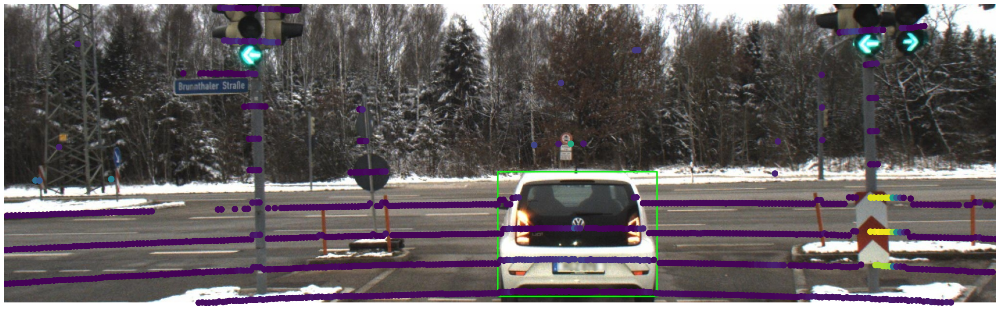

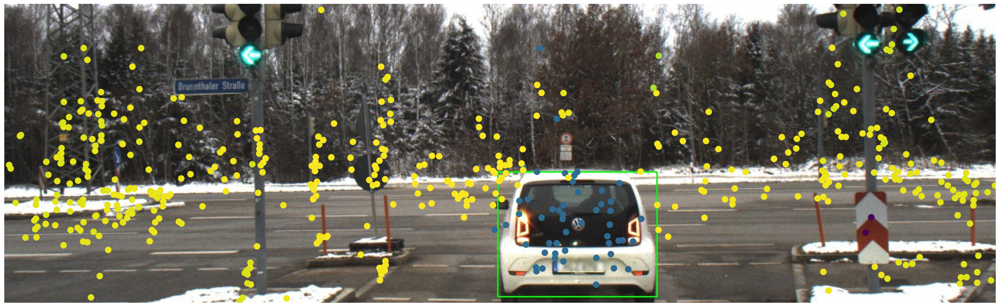

In [6]:
import json
import matplotlib.pyplot as plt
import cv2
import numpy as np

class calib_astyx():
    """This class is designed to manage the calibration of sensor data in autonomous vehicle contexts.
    
    It supports the conversion of sensor data between different coordinate systems, specifically for radar,
    lidar, and camera sensors, to a common reference coordinate system and vice versa. It also handles the
    projection of points from the reference coordinate system onto the camera image plane.
    """
    
    def __init__(self, file):
        """Initialize the calibration object by loading sensor calibration data from a JSON file.
        
        Parameters:
        - file: A string path to the JSON file containing calibration data for radar, lidar, and camera sensors.
        
        The method extracts transformation matrices for each sensor to the reference coordinate system and
        the intrinsic camera matrix.
        """

        # Load calibration data from a JSON file
        with open(file) as json_file:
            data = json.load(json_file)
            
        # Calibration matrices for converting radar, lidar, and camera data to a reference coordinate system
        self.radar2ref = np.array(data["sensors"][0]["calib_data"]["T_to_ref_COS"])  # Radar to reference
        self.lidar2ref_cos = np.array(data["sensors"][1]["calib_data"]["T_to_ref_COS"])  # Lidar to reference (COS means Coordinate System)
        self.camera2ref = np.array(data["sensors"][2]["calib_data"]["T_to_ref_COS"])  # Camera to reference
        self.K = np.array(data["sensors"][2]["calib_data"]["K"])  # Intrinsic camera matrix
        
        # Compute inverse transformations for mapping from the reference coordinate system back to sensor-specific coordinate systems
        self.ref2radar = self.inv_trans(self.radar2ref)
        self.ref2lidar = self.inv_trans(self.lidar2ref_cos)
        self.ref2camera = self.inv_trans(self.camera2ref)

    @staticmethod
    def inv_trans(T):
        """Compute the inverse transformation matrix for a given sensor to reference coordinate transformation.
        
        Parameters:
        - T: A numpy array representing the transformation matrix from sensor to reference coordinates.
        
        Returns:
        - The inverse transformation matrix as a numpy array, which can be used to map points from the
          reference coordinate system back to the sensor-specific coordinate system.
        """
        rotation = np.linalg.inv(T[0:3, 0:3])  # Invert the rotation part
        translation = T[0:3, 3]
        translation = -1 * np.dot(rotation, translation.T)  # Invert the translation part
        translation = np.reshape(translation, (3, 1))
        Q = np.hstack((rotation, translation))  # Reassemble the inverted transformation matrix

        return Q
    
    def lidar2ref(self, points):
        """Convert lidar points from the lidar coordinate system to the reference coordinate system.
        
        Parameters:
        - points: A numpy array of points in the lidar coordinate system.
        
        Returns:
        - A numpy array of the same points transformed to the reference coordinate system.
        """
        n = points.shape[0]
        
        points_hom = np.hstack((points, np.ones((n,1))))  # Convert points to homogeneous coordinates
        points_ref = np.dot(points_hom, np.transpose(self.lidar2ref_cos))  # Transform points to reference coordinate system
        
        return points_ref[:,0:3]  # Return the transformed points, discarding the homogeneous coordinate


    def ref2Camera(self, points, img_size):
        """Project points from the reference coordinate system onto the camera image plane.
        
        Parameters:
        - points: A numpy array of points in the reference coordinate system.
        - img_size: A tuple representing the size of the camera image (width, height).
        
        Returns:
        - A tuple containing a numpy array of the projected points on the camera image plane and a mask
          array indicating which points are within the image frame.
        """
        obj_image = np.dot(self.ref2camera[0:3, 0:3], points.T)  # Apply rotation
        T = self.ref2camera[0:3, 3]
        obj_image = obj_image + T[:, np.newaxis]  # Apply translation
        obj_image = np.dot(self.K, obj_image)  # Apply intrinsic camera matrix
        obj_image = obj_image / obj_image[2]  # Normalize by the third row to project onto image plane
        obj_image = np.delete(obj_image, 2, 0)  # Remove the third row
        
        # Create a mask to filter out points that are outside the image frame or behind the camera
        mask = (obj_image[0,:] <= img_size[0]) & \
               (obj_image[1,:] <= img_size[1]) & \
               (obj_image[0,:] >= 0) & (obj_image[1,:] >= 0) & \
               (points[:,0] >= 0)
        return obj_image[:, mask], mask  # Return the projected points and the mask

root = r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019'
i =85
img = cv2.imread(f"{root}/vehicle_coordinates/{i:06d}_vehicle_detection.jpg")
lidar = np.loadtxt(f"{root}/lidar_vlp16/{i:06d}.txt", skiprows=1)
radar = np.loadtxt(f"{root}/radar_6455/{i:06d}.txt", skiprows=2)
calib = calib_astyx(f"{root}/calibration/{i:06d}.json")


calib.radar2ref
calib.lidar2ref_cos
lidar[:,0:3] = calib.lidar2ref(lidar[:,0:3])
lidarOnImg, lidarOnImgMask = calib.ref2Camera(lidar[:,0:3], ( img.shape[1],img.shape[0]))

radarOnImg, radarOnImgMask = calib.ref2Camera(radar[:,0:3], ( img.shape[1],img.shape[0]))
plt.figure(figsize=(30,30))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.scatter(lidarOnImg[0,:],lidarOnImg[1,:],c=lidar[lidarOnImgMask,3], s = 100)
plt.axis("off")
plt.figure(figsize=(30,30))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.scatter(radarOnImg[0,:],radarOnImg[1,:],c=radar[radarOnImgMask,3], s = 100)
plt.axis("off") 


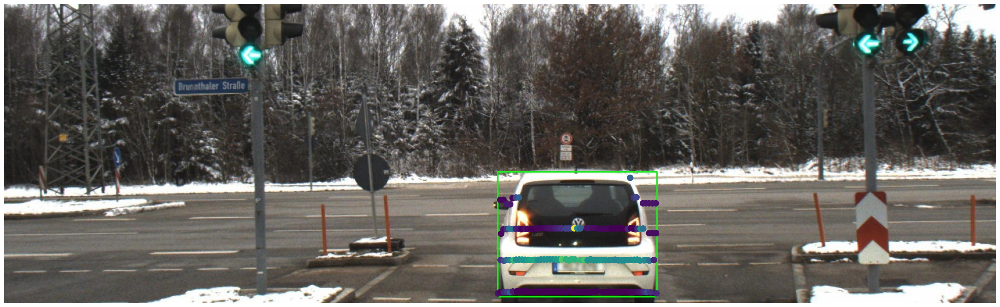

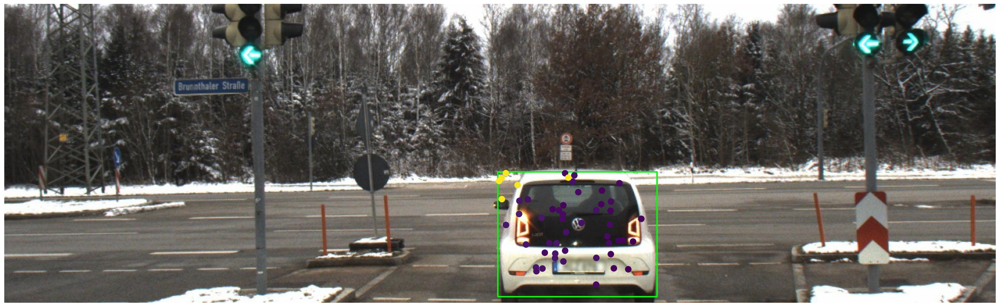

In [7]:
import json
import matplotlib.pyplot as plt
import cv2
import numpy as np

class calib_astyx():
    """This class is designed to manage the calibration of sensor data in autonomous vehicle contexts.
    
    It supports the conversion of sensor data between different coordinate systems, specifically for radar,
    lidar, and camera sensors, to a common reference coordinate system and vice versa. It also handles the
    projection of points from the reference coordinate system onto the camera image plane.
    """
    
    def __init__(self, file):
        """Initialize the calibration object by loading sensor calibration data from a JSON file.
        
        Parameters:
        - file: A string path to the JSON file containing calibration data for radar, lidar, and camera sensors.
        
        The method extracts transformation matrices for each sensor to the reference coordinate system and
        the intrinsic camera matrix.
        """

        # Load calibration data from a JSON file
        with open(file) as json_file:
            data = json.load(json_file)
            
        # Calibration matrices for converting radar, lidar, and camera data to a reference coordinate system
        self.radar2ref = np.array(data["sensors"][0]["calib_data"]["T_to_ref_COS"])  # Radar to reference
        self.lidar2ref_cos = np.array(data["sensors"][1]["calib_data"]["T_to_ref_COS"])  # Lidar to reference (COS means Coordinate System)
        self.camera2ref = np.array(data["sensors"][2]["calib_data"]["T_to_ref_COS"])  # Camera to reference
        self.K = np.array(data["sensors"][2]["calib_data"]["K"])  # Intrinsic camera matrix
        
        # Compute inverse transformations for mapping from the reference coordinate system back to sensor-specific coordinate systems
        self.ref2radar = self.inv_trans(self.radar2ref)
        self.ref2lidar = self.inv_trans(self.lidar2ref_cos)
        self.ref2camera = self.inv_trans(self.camera2ref)

    @staticmethod
    def inv_trans(T):
        """Compute the inverse transformation matrix for a given sensor to reference coordinate transformation.
        
        Parameters:
        - T: A numpy array representing the transformation matrix from sensor to reference coordinates.
        
        Returns:
        - The inverse transformation matrix as a numpy array, which can be used to map points from the
          reference coordinate system back to the sensor-specific coordinate system.
        """
        rotation = np.linalg.inv(T[0:3, 0:3])  # Invert the rotation part
        translation = T[0:3, 3]
        translation = -1 * np.dot(rotation, translation.T)  # Invert the translation part
        translation = np.reshape(translation, (3, 1))
        Q = np.hstack((rotation, translation))  # Reassemble the inverted transformation matrix

        return Q
    
    def lidar2ref(self, points):
        """Convert lidar points from the lidar coordinate system to the reference coordinate system.
        
        Parameters:
        - points: A numpy array of points in the lidar coordinate system.
        
        Returns:
        - A numpy array of the same points transformed to the reference coordinate system.
        """
        n = points.shape[0]
        
        points_hom = np.hstack((points, np.ones((n,1))))  # Convert points to homogeneous coordinates
        points_ref = np.dot(points_hom, np.transpose(self.lidar2ref_cos))  # Transform points to reference coordinate system
        
        return points_ref[:,0:3]  # Return the transformed points, discarding the homogeneous coordinate


    def ref2Camera(self, points, img_size, bbox):
        """Project points from the reference coordinate system onto the camera image plane.
        
        Parameters:
        - points: A numpy array of points in the reference coordinate system.
        - img_size: A tuple representing the size of the camera image (width, height).
        - bbox: A tuple representing the bounding box coordinates (x_min, y_min, x_max, y_max).
        
        Returns:
        - A tuple containing a numpy array of the projected points on the camera image plane and a mask
          array indicating which points are within the image frame and inside the bounding box.
        """
        obj_image = np.dot(self.ref2camera[0:3, 0:3], points.T)  # Apply rotation
        T = self.ref2camera[0:3, 3]
        obj_image = obj_image + T[:, np.newaxis]  # Apply translation
        obj_image = np.dot(self.K, obj_image)  # Apply intrinsic camera matrix
        obj_image = obj_image / obj_image[2]  # Normalize by the third row to project onto image plane
        obj_image = np.delete(obj_image, 2, 0)  # Remove the third row

        # Create a mask to filter out points that are outside the image frame or outside the bounding box
        mask = (obj_image[0, :] <= img_size[0]) & \
               (obj_image[1, :] <= img_size[1]) & \
               (obj_image[0, :] >= 0) & (obj_image[1, :] >= 0) & \
               (obj_image[0, :] >= bbox[0]) & (obj_image[0, :] <= bbox[2]) & \
               (obj_image[1, :] >= bbox[1]) & (obj_image[1, :] <= bbox[3])

        return obj_image[:, mask], mask  # Return the projected points and the mask


root = r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019'
i = 85
img = cv2.imread(f"{root}/vehicle_coordinates/{i:06d}_vehicle_detection.jpg")
lidar = np.loadtxt(f"{root}/lidar_vlp16/{i:06d}.txt", skiprows=1)
radar = np.loadtxt(f"{root}/radar_6455/{i:06d}.txt", skiprows=2)
calib = calib_astyx(f"{root}/calibration/{i:06d}.json")

lidar[:,0:3] = calib.lidar2ref(lidar[:,0:3])
bbox = (1019, 347, 1348, 605)  # Replace with actual bounding box coordinates
lidarOnImg, lidarOnImgMask = calib.ref2Camera(lidar[:,0:3], (img.shape[1], img.shape[0]), bbox)

radarOnImg, radarOnImgMask = calib.ref2Camera(radar[:,0:3], (img.shape[1], img.shape[0]), bbox)

plt.figure(figsize=(30,30))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.scatter(lidarOnImg[0,:], lidarOnImg[1,:], c=lidar[lidarOnImgMask,3], s=100)
plt.axis("off")

plt.figure(figsize=(30,30))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.scatter(radarOnImg[0,:], radarOnImg[1,:], c=radar[radarOnImgMask,3], s=100)
plt.axis("off")
plt.show()

Mean distance from Lidar data: [10.245140815692334]
Mean distance from Radar data: [15.670901844266183]


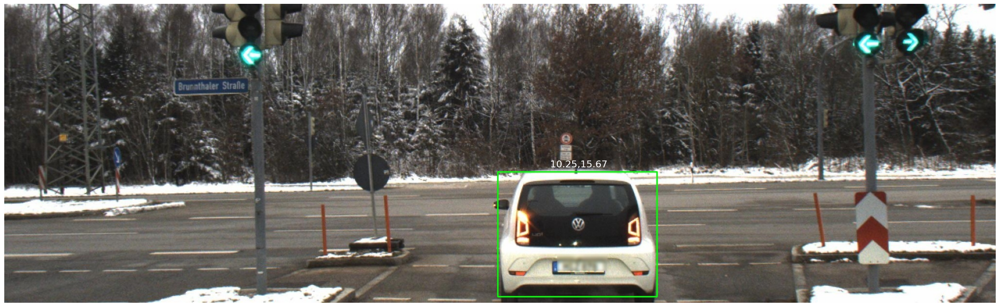

In [8]:
import json
import matplotlib.pyplot as plt
import cv2
import numpy as np

class calib_astyx():
    """This class is designed to manage the calibration of sensor data in autonomous vehicle contexts.
    
    It supports the conversion of sensor data between different coordinate systems, specifically for radar,
    lidar, and camera sensors, to a common reference coordinate system and vice versa. It also handles the
    projection of points from the reference coordinate system onto the camera image plane.
    """
    
    def __init__(self, file):
        """Initialize the calibration object by loading sensor calibration data from a JSON file.
        
        Parameters:
        - file: A string path to the JSON file containing calibration data for radar, lidar, and camera sensors.
        
        The method extracts transformation matrices for each sensor to the reference coordinate system and
        the intrinsic camera matrix.
        """

        # Load calibration data from a JSON file
        with open(file) as json_file:
            data = json.load(json_file)
            
        # Calibration matrices for converting radar, lidar, and camera data to a reference coordinate system
        self.radar2ref = np.array(data["sensors"][0]["calib_data"]["T_to_ref_COS"])  # Radar to reference
        self.lidar2ref_cos = np.array(data["sensors"][1]["calib_data"]["T_to_ref_COS"])  # Lidar to reference (COS means Coordinate System)
        self.camera2ref = np.array(data["sensors"][2]["calib_data"]["T_to_ref_COS"])  # Camera to reference
        self.K = np.array(data["sensors"][2]["calib_data"]["K"])  # Intrinsic camera matrix
        
        # Compute inverse transformations for mapping from the reference coordinate system back to sensor-specific coordinate systems
        self.ref2radar = self.inv_trans(self.radar2ref)
        self.ref2lidar = self.inv_trans(self.lidar2ref_cos)
        self.ref2camera = self.inv_trans(self.camera2ref)

    @staticmethod
    def inv_trans(T):
        """Compute the inverse transformation matrix for a given sensor to reference coordinate transformation.
        
        Parameters:
        - T: A numpy array representing the transformation matrix from sensor to reference coordinates.
        
        Returns:
        - The inverse transformation matrix as a numpy array, which can be used to map points from the
          reference coordinate system back to the sensor-specific coordinate system.
        """
        rotation = np.linalg.inv(T[0:3, 0:3])  # Invert the rotation part
        translation = T[0:3, 3]
        translation = -1 * np.dot(rotation, translation.T)  # Invert the translation part
        translation = np.reshape(translation, (3, 1))
        Q = np.hstack((rotation, translation))  # Reassemble the inverted transformation matrix

        return Q
    
    def lidar2ref(self, points):
        """Convert lidar points from the lidar coordinate system to the reference coordinate system.
        
        Parameters:
        - points: A numpy array of points in the lidar coordinate system.
        
        Returns:
        - A numpy array of the same points transformed to the reference coordinate system.
        """
        n = points.shape[0]
        
        points_hom = np.hstack((points, np.ones((n,1))))  # Convert points to homogeneous coordinates
        points_ref = np.dot(points_hom, np.transpose(self.lidar2ref_cos))  # Transform points to reference coordinate system
        
        return points_ref[:,0:3]  # Return the transformed points, discarding the homogeneous coordinate


    def ref2Camera(self, points, img_size, bbox_list):
        """Project points from the reference coordinate system onto the camera image plane.
        
        Parameters:
        - points: A numpy array of points in the reference coordinate system.
        - img_size: A tuple representing the size of the camera image (width, height).
        - bbox_list: A list of tuples representing the bounding box coordinates [(x_min, y_min, x_max, y_max), ...].
        
        Returns:
        - A tuple containing a numpy array of the projected points on the camera image plane and a mask
          array indicating which points are within the image frame and inside the bounding box.
        """
        obj_image_list = []
        mask_list = []
        
        for bbox in bbox_list:
            obj_image = np.dot(self.ref2camera[0:3, 0:3], points.T)  # Apply rotation
            T = self.ref2camera[0:3, 3]
            obj_image = obj_image + T[:, np.newaxis]  # Apply translation
            obj_image = np.dot(self.K, obj_image)  # Apply intrinsic camera matrix
            obj_image = obj_image / obj_image[2]  # Normalize by the third row to project onto image plane
            obj_image = np.delete(obj_image, 2, 0)  # Remove the third row

            # Create a mask to filter out points that are outside the image frame or outside the bounding box
            mask = (obj_image[0, :] <= img_size[0]) & \
                   (obj_image[1, :] <= img_size[1]) & \
                   (obj_image[0, :] >= 0) & (obj_image[1, :] >= 0) & \
                   (obj_image[0, :] >= bbox[0]) & (obj_image[0, :] <= bbox[2]) & \
                   (obj_image[1, :] >= bbox[1]) & (obj_image[1, :] <= bbox[3])

            obj_image_list.append(obj_image[:, mask])
            mask_list.append(mask)
        
        return obj_image_list, mask_list  # Return the projected points list and the mask list
    
    def mean_distance(self, points, mask):
        """Calculate the mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        
        Parameters:
        - points: A numpy array of points in 3D space.
        - mask: A boolean mask indicating which points are inside the bounding box.
        
        Returns:
        - The mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        """
        camera_points = np.dot(self.ref2camera[0:3, 0:3], points) + self.ref2camera[0:3, 3][:, np.newaxis]
        distance = np.linalg.norm(camera_points, axis=0)
        return np.mean(distance)

root = r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019'
i = 85
img = cv2.imread(f"{root}/vehicle_coordinates/{i:06d}_vehicle_detection.jpg")
lidar = np.loadtxt(f"{root}/lidar_vlp16/{i:06d}.txt", skiprows=1)
radar = np.loadtxt(f"{root}/radar_6455/{i:06d}.txt", skiprows=2)
calib = calib_astyx(f"{root}/calibration/{i:06d}.json")

# Load bounding box coordinates from file
bbox_file = f"{root}/vehicle_coordinates/{i:06d}_vehicle_coordinates.txt"
bounding_boxes = []
with open(bbox_file, 'r') as f:
    for line in f:
        bbox_data = line.strip().split()  # Split by spaces
        bbox = tuple(map(int, bbox_data))  # Convert to tuple of integers
        bounding_boxes.append(bbox)

lidar[:,0:3] = calib.lidar2ref(lidar[:,0:3])
lidarOnImg, lidarOnImgMask = calib.ref2Camera(lidar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)

radarOnImg, radarOnImgMask = calib.ref2Camera(radar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)

lidar_points_inside_bbox = [lidar[mask] for mask in lidarOnImgMask]
lidar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in lidar_points_inside_bbox]

radar_points_inside_bbox = [radar[mask] for mask in radarOnImgMask]
radar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in radar_points_inside_bbox]

print("Mean distance from Lidar data:", lidar_mean_distance)
print("Mean distance from Radar data:", radar_mean_distance)

plt.figure(figsize=(30,30))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
for points, lidar_distance, radar_distance, bbox in zip(lidarOnImg, lidar_mean_distance, radar_mean_distance, bounding_boxes):
    text_x = (bbox[0] + bbox[2]) / 2
    text_y = bbox[1] - 10  # Move the text slightly above the bounding box
    plt.text(text_x, text_y, f' {lidar_distance:.2f},{radar_distance:.2f}', color='white', fontsize=16, ha='center')
plt.axis("off")
plt.show()

Mean distance from Lidar data: [10.245140815692334]
Mean distance from Radar data: [15.670901844266183]


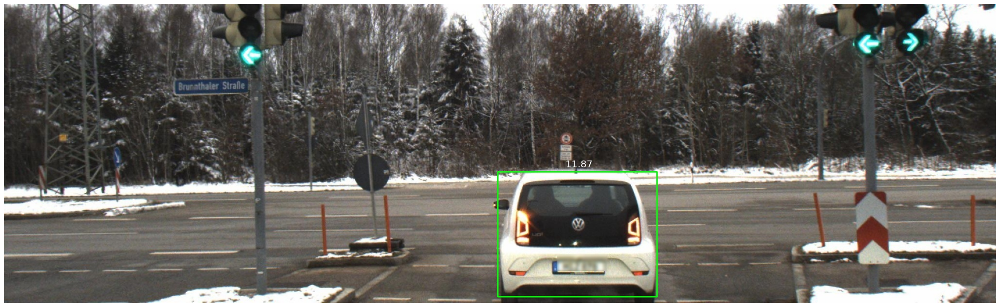

In [9]:
import json
import matplotlib.pyplot as plt
import cv2
import numpy as np

class calib_astyx():
    """This class is designed to manage the calibration of sensor data in autonomous vehicle contexts.
    
    It supports the conversion of sensor data between different coordinate systems, specifically for radar,
    lidar, and camera sensors, to a common reference coordinate system and vice versa. It also handles the
    projection of points from the reference coordinate system onto the camera image plane.
    """
    
    def __init__(self, file):
        """Initialize the calibration object by loading sensor calibration data from a JSON file.
        
        Parameters:
        - file: A string path to the JSON file containing calibration data for radar, lidar, and camera sensors.
        
        The method extracts transformation matrices for each sensor to the reference coordinate system and
        the intrinsic camera matrix.
        """

        # Load calibration data from a JSON file
        with open(file) as json_file:
            data = json.load(json_file)
            
        # Calibration matrices for converting radar, lidar, and camera data to a reference coordinate system
        self.radar2ref = np.array(data["sensors"][0]["calib_data"]["T_to_ref_COS"])  # Radar to reference
        self.lidar2ref_cos = np.array(data["sensors"][1]["calib_data"]["T_to_ref_COS"])  # Lidar to reference (COS means Coordinate System)
        self.camera2ref = np.array(data["sensors"][2]["calib_data"]["T_to_ref_COS"])  # Camera to reference
        self.K = np.array(data["sensors"][2]["calib_data"]["K"])  # Intrinsic camera matrix
        
        # Compute inverse transformations for mapping from the reference coordinate system back to sensor-specific coordinate systems
        self.ref2radar = self.inv_trans(self.radar2ref)
        self.ref2lidar = self.inv_trans(self.lidar2ref_cos)
        self.ref2camera = self.inv_trans(self.camera2ref)

    @staticmethod
    def inv_trans(T):
        """Compute the inverse transformation matrix for a given sensor to reference coordinate transformation.
        
        Parameters:
        - T: A numpy array representing the transformation matrix from sensor to reference coordinates.
        
        Returns:
        - The inverse transformation matrix as a numpy array, which can be used to map points from the
          reference coordinate system back to the sensor-specific coordinate system.
        """
        rotation = np.linalg.inv(T[0:3, 0:3])  # Invert the rotation part
        translation = T[0:3, 3]
        translation = -1 * np.dot(rotation, translation.T)  # Invert the translation part
        translation = np.reshape(translation, (3, 1))
        Q = np.hstack((rotation, translation))  # Reassemble the inverted transformation matrix

        return Q
    
    def lidar2ref(self, points):
        """Convert lidar points from the lidar coordinate system to the reference coordinate system.
        
        Parameters:
        - points: A numpy array of points in the lidar coordinate system.
        
        Returns:
        - A numpy array of the same points transformed to the reference coordinate system.
        """
        n = points.shape[0]
        
        points_hom = np.hstack((points, np.ones((n,1))))  # Convert points to homogeneous coordinates
        points_ref = np.dot(points_hom, np.transpose(self.lidar2ref_cos))  # Transform points to reference coordinate system
        
        return points_ref[:,0:3]  # Return the transformed points, discarding the homogeneous coordinate


    def ref2Camera(self, points, img_size, bbox_list):
        """Project points from the reference coordinate system onto the camera image plane.
        
        Parameters:
        - points: A numpy array of points in the reference coordinate system.
        - img_size: A tuple representing the size of the camera image (width, height).
        - bbox_list: A list of tuples representing the bounding box coordinates [(x_min, y_min, x_max, y_max), ...].
        
        Returns:
        - A tuple containing a numpy array of the projected points on the camera image plane and a mask
          array indicating which points are within the image frame and inside the bounding box.
        """
        obj_image_list = []
        mask_list = []
        
        for bbox in bbox_list:
            obj_image = np.dot(self.ref2camera[0:3, 0:3], points.T)  # Apply rotation
            T = self.ref2camera[0:3, 3]
            obj_image = obj_image + T[:, np.newaxis]  # Apply translation
            obj_image = np.dot(self.K, obj_image)  # Apply intrinsic camera matrix
            obj_image = obj_image / obj_image[2]  # Normalize by the third row to project onto image plane
            obj_image = np.delete(obj_image, 2, 0)  # Remove the third row

            # Create a mask to filter out points that are outside the image frame or outside the bounding box
            mask = (obj_image[0, :] <= img_size[0]) & \
                   (obj_image[1, :] <= img_size[1]) & \
                   (obj_image[0, :] >= 0) & (obj_image[1, :] >= 0) & \
                   (obj_image[0, :] >= bbox[0]) & (obj_image[0, :] <= bbox[2]) & \
                   (obj_image[1, :] >= bbox[1]) & (obj_image[1, :] <= bbox[3])

            obj_image_list.append(obj_image[:, mask])
            mask_list.append(mask)
        
        return obj_image_list, mask_list  # Return the projected points list and the mask list
    
    def mean_distance(self, points, mask):
        """Calculate the mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        
        Parameters:
        - points: A numpy array of points in 3D space.
        - mask: A boolean mask indicating which points are inside the bounding box.
        
        Returns:
        - The mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        """
        camera_points = np.dot(self.ref2camera[0:3, 0:3], points) + self.ref2camera[0:3, 3][:, np.newaxis]
        distance = np.linalg.norm(camera_points, axis=0)
        return np.mean(distance)

# Function to calculate fused distance using weighted averaging
def calculate_fused_distance(lidar_mean_distance, radar_mean_distance):
    lidar_weight = 0.7  # Weight for lidar distance
    radar_weight = 0.3  # Weight for radar distance
    return lidar_weight * lidar_mean_distance + radar_weight * radar_mean_distance

# Main code
root = r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019'
i = 85
img = cv2.imread(f"{root}/vehicle_coordinates/{i:06d}_vehicle_detection.jpg")
lidar = np.loadtxt(f"{root}/lidar_vlp16/{i:06d}.txt", skiprows=1)
radar = np.loadtxt(f"{root}/radar_6455/{i:06d}.txt", skiprows=2)
calib = calib_astyx(f"{root}/calibration/{i:06d}.json")

# Load bounding box coordinates from file
bbox_file = f"{root}/vehicle_coordinates/{i:06d}_vehicle_coordinates.txt"
bounding_boxes = []
with open(bbox_file, 'r') as f:
    for line in f:
        bbox_data = line.strip().split()  # Split by spaces
        bbox = tuple(map(int, bbox_data))  # Convert to tuple of integers
        bounding_boxes.append(bbox)

lidar[:,0:3] = calib.lidar2ref(lidar[:,0:3])
lidarOnImg, lidarOnImgMask = calib.ref2Camera(lidar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)

radarOnImg, radarOnImgMask = calib.ref2Camera(radar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)

lidar_points_inside_bbox = [lidar[mask] for mask in lidarOnImgMask]
lidar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in lidar_points_inside_bbox]

radar_points_inside_bbox = [radar[mask] for mask in radarOnImgMask]
radar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in radar_points_inside_bbox]

print("Mean distance from Lidar data:", lidar_mean_distance)
print("Mean distance from Radar data:", radar_mean_distance)

plt.figure(figsize=(30,30))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
for points, lidar_distance, radar_distance, bbox in zip(lidarOnImg, lidar_mean_distance, radar_mean_distance, bounding_boxes):
    fused_distance = calculate_fused_distance(lidar_distance, radar_distance)
    text_x = (bbox[0] + bbox[2]) / 2
    text_y = bbox[1] - 10  # Move the text slightly above the bounding box
    plt.text(text_x, text_y, f' {fused_distance:.2f}', color='white', fontsize=16, ha='center')
plt.axis("off")
plt.show()

In [1]:
import json
import matplotlib.pyplot as plt
import cv2
import numpy as np

class calib_astyx():
    """This class is designed to manage the calibration of sensor data in autonomous vehicle contexts.
    
    It supports the conversion of sensor data between different coordinate systems, specifically for radar,
    lidar, and camera sensors, to a common reference coordinate system and vice versa. It also handles the
    projection of points from the reference coordinate system onto the camera image plane.
    """
    
    def __init__(self, file):
        """Initialize the calibration object by loading sensor calibration data from a JSON file.
        
        Parameters:
        - file: A string path to the JSON file containing calibration data for radar, lidar, and camera sensors.
        
        The method extracts transformation matrices for each sensor to the reference coordinate system and
        the intrinsic camera matrix.
        """

        # Load calibration data from a JSON file
        with open(file) as json_file:
            data = json.load(json_file)
            
        # Calibration matrices for converting radar, lidar, and camera data to a reference coordinate system
        self.radar2ref = np.array(data["sensors"][0]["calib_data"]["T_to_ref_COS"])  # Radar to reference
        self.lidar2ref_cos = np.array(data["sensors"][1]["calib_data"]["T_to_ref_COS"])  # Lidar to reference (COS means Coordinate System)
        self.camera2ref = np.array(data["sensors"][2]["calib_data"]["T_to_ref_COS"])  # Camera to reference
        self.K = np.array(data["sensors"][2]["calib_data"]["K"])  # Intrinsic camera matrix
        
        # Compute inverse transformations for mapping from the reference coordinate system back to sensor-specific coordinate systems
        self.ref2radar = self.inv_trans(self.radar2ref)
        self.ref2lidar = self.inv_trans(self.lidar2ref_cos)
        self.ref2camera = self.inv_trans(self.camera2ref)

    @staticmethod
    def inv_trans(T):
        """Compute the inverse transformation matrix for a given sensor to reference coordinate transformation.
        
        Parameters:
        - T: A numpy array representing the transformation matrix from sensor to reference coordinates.
        
        Returns:
        - The inverse transformation matrix as a numpy array, which can be used to map points from the
          reference coordinate system back to the sensor-specific coordinate system.
        """
        rotation = np.linalg.inv(T[0:3, 0:3])  # Invert the rotation part
        translation = T[0:3, 3]
        translation = -1 * np.dot(rotation, translation.T)  # Invert the translation part
        translation = np.reshape(translation, (3, 1))
        Q = np.hstack((rotation, translation))  # Reassemble the inverted transformation matrix

        return Q
    
    def lidar2ref(self, points):
        """Convert lidar points from the lidar coordinate system to the reference coordinate system.
        
        Parameters:
        - points: A numpy array of points in the lidar coordinate system.
        
        Returns:
        - A numpy array of the same points transformed to the reference coordinate system.
        """
        n = points.shape[0]
        
        points_hom = np.hstack((points, np.ones((n,1))))  # Convert points to homogeneous coordinates
        points_ref = np.dot(points_hom, np.transpose(self.lidar2ref_cos))  # Transform points to reference coordinate system
        
        return points_ref[:,0:3]  # Return the transformed points, discarding the homogeneous coordinate


    def ref2Camera(self, points, img_size, bbox_list):
        """Project points from the reference coordinate system onto the camera image plane.
        
        Parameters:
        - points: A numpy array of points in the reference coordinate system.
        - img_size: A tuple representing the size of the camera image (width, height).
        - bbox_list: A list of tuples representing the bounding box coordinates [(x_min, y_min, x_max, y_max), ...].
        
        Returns:
        - A tuple containing a numpy array of the projected points on the camera image plane and a mask
          array indicating which points are within the image frame and inside the bounding box.
        """
        obj_image_list = []
        mask_list = []
        
        for bbox in bbox_list:
            obj_image = np.dot(self.ref2camera[0:3, 0:3], points.T)  # Apply rotation
            T = self.ref2camera[0:3, 3]
            obj_image = obj_image + T[:, np.newaxis]  # Apply translation
            obj_image = np.dot(self.K, obj_image)  # Apply intrinsic camera matrix
            obj_image = obj_image / obj_image[2]  # Normalize by the third row to project onto image plane
            obj_image = np.delete(obj_image, 2, 0)  # Remove the third row

            # Create a mask to filter out points that are outside the image frame or outside the bounding box
            mask = (obj_image[0, :] <= img_size[0]) & \
                   (obj_image[1, :] <= img_size[1]) & \
                   (obj_image[0, :] >= 0) & (obj_image[1, :] >= 0) & \
                   (obj_image[0, :] >= bbox[0]) & (obj_image[0, :] <= bbox[2]) & \
                   (obj_image[1, :] >= bbox[1]) & (obj_image[1, :] <= bbox[3])

            obj_image_list.append(obj_image[:, mask])
            mask_list.append(mask)
        
        return obj_image_list, mask_list  # Return the projected points list and the mask list
    
    def mean_distance(self, points, mask):
        """Calculate the mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        
        Parameters:
        - points: A numpy array of points in 3D space.
        - mask: A boolean mask indicating which points are inside the bounding box.
        
        Returns:
        - The mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        """
        camera_points = np.dot(self.ref2camera[0:3, 0:3], points) + self.ref2camera[0:3, 3][:, np.newaxis]
        distance = np.linalg.norm(camera_points, axis=0)
        return np.mean(distance)

# Function to calculate fused distance using weighted averaging
def calculate_fused_distance(lidar_mean_distance, radar_mean_distance):
    lidar_weight = 0.7  # Weight for lidar distance
    radar_weight = 0.3  # Weight for radar distance
    return lidar_weight * lidar_mean_distance + radar_weight * radar_mean_distance

# Main code
root = r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019'
i = 131
img = cv2.imread(f"{root}/vehicle_coordinates/{i:06d}_vehicle_detection.jpg")
lidar = np.loadtxt(f"{root}/lidar_vlp16/{i:06d}.txt", skiprows=1)
radar = np.loadtxt(f"{root}/radar_6455/{i:06d}.txt", skiprows=2)
calib = calib_astyx(f"{root}/calibration/{i:06d}.json")

# Load bounding box coordinates from file
bbox_file = f"{root}/vehicle_coordinates/{i:06d}_vehicle_coordinates.txt"
bounding_boxes = []
with open(bbox_file, 'r') as f:
    for line in f:
        bbox_data = line.strip().split()  # Split by spaces
        bbox = tuple(map(int, bbox_data))  # Convert to tuple of integers
        bounding_boxes.append(bbox)

lidar[:,0:3] = calib.lidar2ref(lidar[:,0:3])
lidarOnImg, lidarOnImgMask = calib.ref2Camera(lidar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)

radarOnImg, radarOnImgMask = calib.ref2Camera(radar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)

lidar_points_inside_bbox = [lidar[mask] for mask in lidarOnImgMask]
lidar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in lidar_points_inside_bbox]

radar_points_inside_bbox = [radar[mask] for mask in radarOnImgMask]
radar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in radar_points_inside_bbox]

print("Mean distance from Lidar data:", lidar_mean_distance)
print("Mean distance from Radar data:", radar_mean_distance)

true_distance_file = f"{root}/groundtruth_obj3d/{i:06d}.json"
# Ground truth distances from 3D bounding box
with open (true_distance_file, 'r')as f:
    true_distance_data = json.load(f)
    true_distance = []


# # Ground truth distances from 3D bounding box
# ground_truth_distances = np.loadtxt(f"{root}/groundtruth_obj3d/{i:06d}.json")

# Compute mean absolute error (MAE) and root mean square error (RMSE)
lidar_mae = np.mean(np.abs(ground_truth_distances - lidar_mean_distance))
radar_mae = np.mean(np.abs(ground_truth_distances - radar_mean_distance))
lidar_rmse = np.sqrt(np.mean((ground_truth_distances - lidar_mean_distance)**2))
radar_rmse = np.sqrt(np.mean((ground_truth_distances - radar_mean_distance)**2))

# Print MAE and RMSE
print("Lidar MAE:", lidar_mae)
print("Lidar RMSE:", lidar_rmse)
print("Radar MAE:", radar_mae)
print("Radar RMSE:", radar_rmse)

plt.figure(figsize=(30,30))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
for points, lidar_distance, radar_distance, bbox in zip(lidarOnImg, lidar_mean_distance, radar_mean_distance, bounding_boxes):
    fused_distance = calculate_fused_distance(lidar_distance, radar_distance)
    text_x = (bbox[0] + bbox[2]) / 2
    text_y = bbox[1] - 10  # Move the text slightly above the bounding box
    plt.text(text_x, text_y, f' {fused_distance:.2f}', color='white', fontsize=16, ha='center')
plt.axis("off")
plt.show()

Mean distance from Lidar data: [28.710310793020138]
Mean distance from Radar data: [31.938021945158052]


NameError: name 'ground_truth_distances' is not defined

Mean Absolute Error (MAE): [1.135979389167856]
Root Mean Square Error (RMSE) : [1.135979389167856]


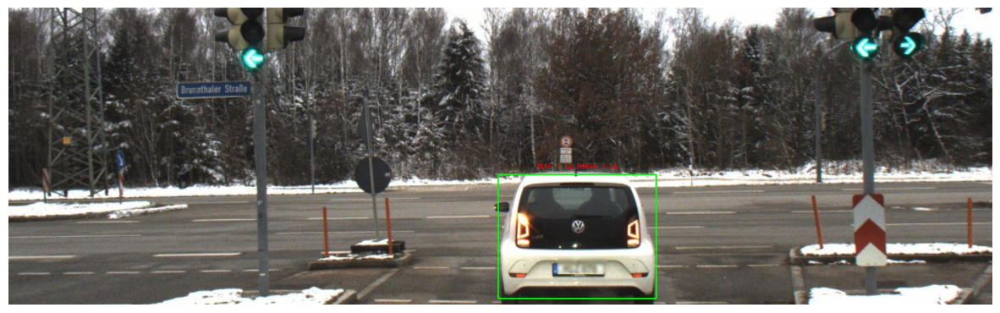

In [10]:
import json
import matplotlib.pyplot as plt
import cv2
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

class calib_astyx():
    """This class is designed to manage the calibration of sensor data in autonomous vehicle contexts.
    
    It supports the conversion of sensor data between different coordinate systems, specifically for radar,
    lidar, and camera sensors, to a common reference coordinate system and vice versa. It also handles the
    projection of points from the reference coordinate system onto the camera image plane.
    """
    
    def __init__(self, file):
        """Initialize the calibration object by loading sensor calibration data from a JSON file.
        
        Parameters:
        - file: A string path to the JSON file containing calibration data for radar, lidar, and camera sensors.
        
        The method extracts transformation matrices for each sensor to the reference coordinate system and
        the intrinsic camera matrix.
        """

        # Load calibration data from a JSON file
        with open(file) as json_file:
            data = json.load(json_file)
            
        # Calibration matrices for converting radar, lidar, and camera data to a reference coordinate system
        self.radar2ref = np.array(data["sensors"][0]["calib_data"]["T_to_ref_COS"])  # Radar to reference
        self.lidar2ref_cos = np.array(data["sensors"][1]["calib_data"]["T_to_ref_COS"])  # Lidar to reference (COS means Coordinate System)
        self.camera2ref = np.array(data["sensors"][2]["calib_data"]["T_to_ref_COS"])  # Camera to reference
        self.K = np.array(data["sensors"][2]["calib_data"]["K"])  # Intrinsic camera matrix
        
        # Compute inverse transformations for mapping from the reference coordinate system back to sensor-specific coordinate systems
        self.ref2radar = self.inv_trans(self.radar2ref)
        self.ref2lidar = self.inv_trans(self.lidar2ref_cos)
        self.ref2camera = self.inv_trans(self.camera2ref)

    @staticmethod
    def inv_trans(T):
        """Compute the inverse transformation matrix for a given sensor to reference coordinate transformation.
        
        Parameters:
        - T: A numpy array representing the transformation matrix from sensor to reference coordinates.
        
        Returns:
        - The inverse transformation matrix as a numpy array, which can be used to map points from the
          reference coordinate system back to the sensor-specific coordinate system.
        """
        rotation = np.linalg.inv(T[0:3, 0:3])  # Invert the rotation part
        translation = T[0:3, 3]
        translation = -1 * np.dot(rotation, translation.T)  # Invert the translation part
        translation = np.reshape(translation, (3, 1))
        Q = np.hstack((rotation, translation))  # Reassemble the inverted transformation matrix

        return Q
    
    def lidar2ref(self, points):
        """Convert lidar points from the lidar coordinate system to the reference coordinate system.
        
        Parameters:
        - points: A numpy array of points in the lidar coordinate system.
        
        Returns:
        - A numpy array of the same points transformed to the reference coordinate system.
        """
        n = points.shape[0]
        
        points_hom = np.hstack((points, np.ones((n,1))))  # Convert points to homogeneous coordinates
        points_ref = np.dot(points_hom, np.transpose(self.lidar2ref_cos))  # Transform points to reference coordinate system
        
        return points_ref[:,0:3]  # Return the transformed points, discarding the homogeneous coordinate


    def ref2Camera(self, points, img_size, bbox_list):
        """Project points from the reference coordinate system onto the camera image plane.
        
        Parameters:
        - points: A numpy array of points in the reference coordinate system.
        - img_size: A tuple representing the size of the camera image (width, height).
        - bbox_list: A list of tuples representing the bounding box coordinates [(x_min, y_min, x_max, y_max), ...].
        
        Returns:
        - A tuple containing a numpy array of the projected points on the camera image plane and a mask
          array indicating which points are within the image frame and inside the bounding box.
        """
        obj_image_list = []
        mask_list = []
        
        for bbox in bbox_list:
            obj_image = np.dot(self.ref2camera[0:3, 0:3], points.T)  # Apply rotation
            T = self.ref2camera[0:3, 3]
            obj_image = obj_image + T[:, np.newaxis]  # Apply translation
            obj_image = np.dot(self.K, obj_image)  # Apply intrinsic camera matrix
            obj_image = obj_image / obj_image[2]  # Normalize by the third row to project onto image plane
            obj_image = np.delete(obj_image, 2, 0)  # Remove the third row

            # Create a mask to filter out points that are outside the image frame or outside the bounding box
            mask = (obj_image[0, :] <= img_size[0]) & \
                   (obj_image[1, :] <= img_size[1]) & \
                   (obj_image[0, :] >= 0) & (obj_image[1, :] >= 0) & \
                   (obj_image[0, :] >= bbox[0]) & (obj_image[0, :] <= bbox[2]) & \
                   (obj_image[1, :] >= bbox[1]) & (obj_image[1, :] <= bbox[3])

            obj_image_list.append(obj_image[:, mask])
            mask_list.append(mask)
        
        return obj_image_list, mask_list  # Return the projected points list and the mask list
    
    def mean_distance(self, points, mask):
        """Calculate the mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        
        Parameters:
        - points: A numpy array of points in 3D space.
        - mask: A boolean mask indicating which points are inside the bounding box.
        
        Returns:
        - The mean Euclidean distance of the points from the camera's viewpoint inside the bounding box.
        """
        camera_points = np.dot(self.ref2camera[0:3, 0:3], points) + self.ref2camera[0:3, 3][:, np.newaxis]
        distance = np.linalg.norm(camera_points, axis=0)
        return np.mean(distance)

# Function to calculate fused distance using weighted averaging
def calculate_fused_distance(lidar_mean_distance, radar_mean_distance):
    lidar_weight = 0.7  # Weight for lidar distance
    radar_weight = 0.3  # Weight for radar distance
    return lidar_weight * lidar_mean_distance + radar_weight * radar_mean_distance

# Function to calculate mean absolute error (MAE) and root mean square error (RMSE)
def calculate_accuracy(true_distances, estimated_distances):
    mae = np.nanmean(np.abs(np.array(true_distances) - np.array(estimated_distances)))
    rmse = np.sqrt(np.nanmean((np.array(true_distances) - np.array(estimated_distances))**2))
    return mae, rmse

# Main code
root = r'D:\My courses\2nd Sem\Sensor_Fusion\dataset_astyx_hires2019\dataset_astyx_hires2019'
i = 85# Choose the image number
img = cv2.imread(f"{root}/vehicle_coordinates/{i:06d}_vehicle_detection.jpg")
lidar = np.loadtxt(f"{root}/lidar_vlp16/{i:06d}.txt", skiprows=1)
radar = np.loadtxt(f"{root}/radar_6455/{i:06d}.txt", skiprows=2)
calib = calib_astyx(f"{root}/calibration/{i:06d}.json")

# Load bounding box coordinates from file
bbox_file = f"{root}/vehicle_coordinates/{i:06d}_vehicle_coordinates.txt"
bounding_boxes = []
with open(bbox_file, 'r') as f:
    for line in f:
        bbox_data = line.strip().split()  # Split by spaces
        bbox = tuple(map(int, bbox_data))  # Convert to tuple of integers
        bounding_boxes.append(bbox)

lidar[:,0:3] = calib.lidar2ref(lidar[:,0:3])
lidarOnImg, lidarOnImgMask = calib.ref2Camera(lidar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)
radarOnImg, radarOnImgMask = calib.ref2Camera(radar[:,0:3], (img.shape[1], img.shape[0]), bounding_boxes)

lidar_points_inside_bbox = [lidar[mask] for mask in lidarOnImgMask]
lidar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in lidar_points_inside_bbox]

radar_points_inside_bbox = [radar[mask] for mask in radarOnImgMask]
radar_mean_distance = [calib.mean_distance(points[:, 0:3].T, np.ones(len(points), dtype=bool)) for points in radar_points_inside_bbox]

true_distances_file = f"{root}/groundtruth_obj3d/{i:06d}.json"
with open(true_distances_file, 'r') as f:
    true_distances_data = json.load(f)
true_distances = []

for obj in true_distances_data['objects']:
    center3d = np.array(obj['center3d'])
    true_distances.append(np.linalg.norm(center3d))  # Calculate Euclidean distance for each center3d coordinate

mae_list = []
rmse_list = []

plt.figure(figsize=(15, 10))  # Set the figure size

for lidar_points, radar_points, lidar_distance, radar_distance, true_distance, bbox in zip(lidar_points_inside_bbox, radar_points_inside_bbox, lidar_mean_distance, radar_mean_distance, true_distances, bounding_boxes):
    fused_distance = calculate_fused_distance(lidar_distance, radar_distance)
    estimated_distances = [fused_distance] * len(lidar_points)  # Use the same fused distance for all lidar and radar points inside the same bbox
    mae, rmse = calculate_accuracy([true_distance] * len(lidar_points), estimated_distances)
    mae_list.append(mae)
    rmse_list.append(rmse)
    
    # Add text annotation for MAE and RMSE on top of each bounding box
    bbox_center_x = (bbox[0] + bbox[2]) / 2
    bbox_center_y = bbox[1] - 10  # Slightly above the bounding box
    plt.text(bbox_center_x, bbox_center_y, f'MAE: {mae:.2f}, RMSE: {rmse:.2f}', color='red', fontsize=6, ha='center', va='bottom')

print("Mean Absolute Error (MAE):", mae_list)
print("Root Mean Square Error (RMSE) :", rmse_list)

# Display the image with bounding boxes and error annotations
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
